In [1]:
#pip install matplotlib numpy pandas seaborn

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure
import seaborn as sns
import random
import sys
from itertools import combinations
import scipy.cluster.hierarchy as shc

%cd ..
from src import sw3c, evolution_simulator

/home/mounim/Projects/SW3C


## 1 - simulated dataset

In [2]:
#set version-name and input sequence
id = "Test01"
L = 100
O = evolution_simulator.generate_random_seq(L) #sequence of lenght L
# evolution_simulator.to_fasta(O,id, "../data/simulated_dataset/") #sequence of lenght L
#add x mutations
X = 30 
evolution_simulator.add_n_mutations(O,X)

'AGTGGAGTCTTACACGAAAATCCGTGGCGCCGAGGGTTCGGTTCCTCGGTGCAGTTACATTATTGTAGGAATTCTAAGGACATAGTAACGCAGTGGACCACT'

In [3]:
def dict_to_fasta(dict,path='./data/1 - simulated_dataset/'):
    file=open(path+'simulated_dataset.fasta','a+')
    for id in dict:
        sequence=dict[id]
        file.write('>'+str(id)+'\n')
        file.write(sequence.replace('\n','')+'\n')

In [4]:
version = "Random_sequence"
L = 100
P0 = 0.1 # mutation rate
P = 0.01 # mutation rate
generations = 15
O = evolution_simulator.generate_random_seq(L) #sequence of lenght L
simulated_dataset = {}
main_branches = ["A", "B"]
for branch in main_branches:
    parent = evolution_simulator.add_p_mutations(O, P0)
    simulated_dataset[branch] = parent
    for gen in range(generations):
        parent = evolution_simulator.add_p_mutations(parent, P)
        # print(branch+str(gen))
        simulated_dataset[branch+str(gen)]=parent

# export result to file
dict_to_fasta(simulated_dataset)

In [5]:
import os
os.getcwd()

'/home/mounim/Projects/SW3C'

In [6]:
## set size and gap: no gaps (step = 1)
size, gap = 7,1
d = 5 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/1 - simulated_dataset/simulated_dataset.fasta" ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(10, 10) )
map.ax_heatmap.set_title("size = "+str(size)+", gap ="+str(gap)+" ", y = -0.2 )


plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'), labels=data_piv.index)
plt.title("size = "+str(size)+", gap ="+str(gap)+" ", y = -0.2 )



TypeError: 'set' object is not subscriptable

#### testing with different size and gap

Text(0.5, 1.0, 'Dendrograms k = 7, w =4 ')

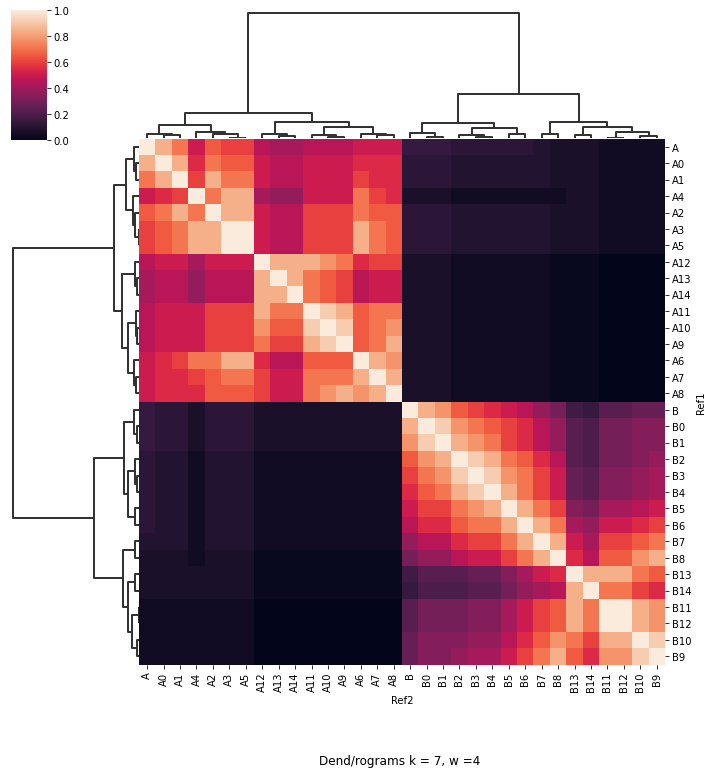

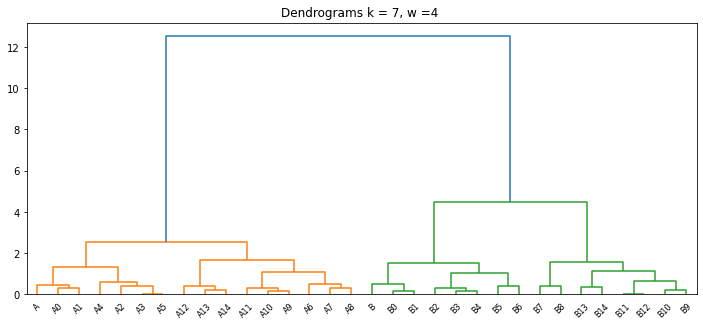

In [ ]:

size, gap = 7,4
d = 5 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/1 - simulated_dataset/simulated_dataset.fasta" ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(10, 10) )
map.ax_heatmap.set_title("size = "+str(size)+", gap ="+str(gap)+" ", y = -0.2 )


plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'), labels=data_piv.index)
plt.title("size = "+str(size)+", gap ="+str(gap)+" ", y = -0.2 )



### Higher size and gaps

Text(0.5, 1.0, 'Dendrograms k = 30, w =15 ')

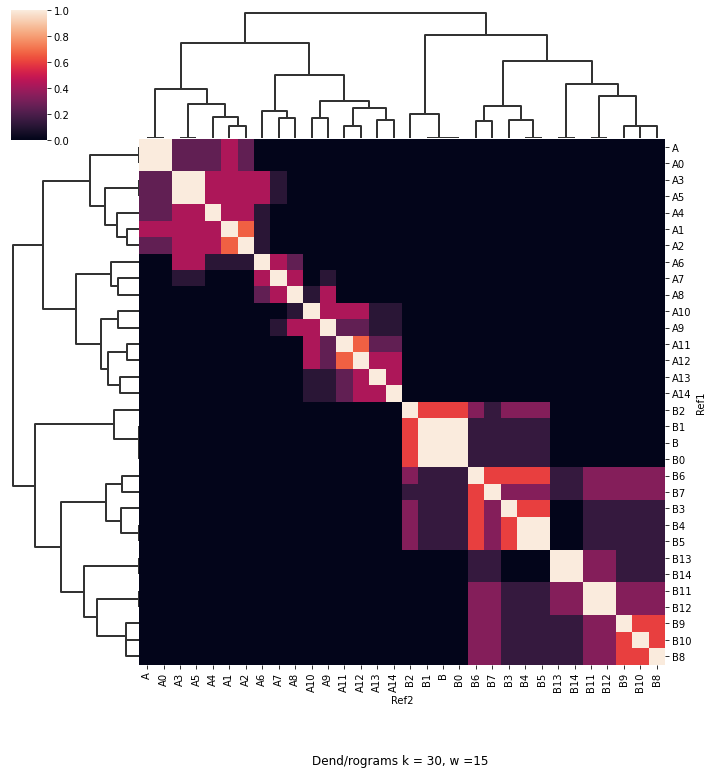

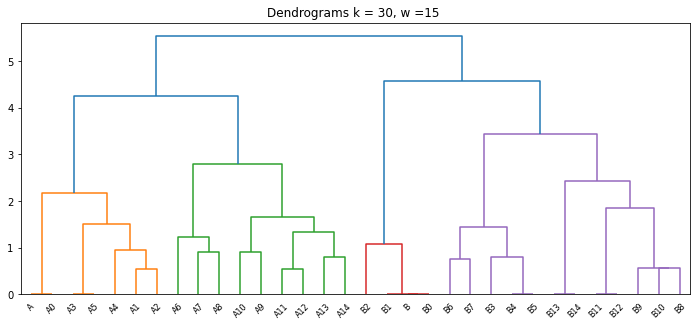

In [ ]:

size, gap = 30,15
d = 5 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/1 - simulated_dataset/simulated_dataset.fasta" ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(10, 10) )
map.ax_heatmap.set_title("size = "+str(size)+", gap ="+str(gap)+" ", y = -0.2 )


plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'), labels=data_piv.index)
plt.title("size = "+str(size)+", gap ="+str(gap)+" ", y = -0.2 )

### Real Dataset 1: Beta-Corona Virus (Na Zhu 2020) 

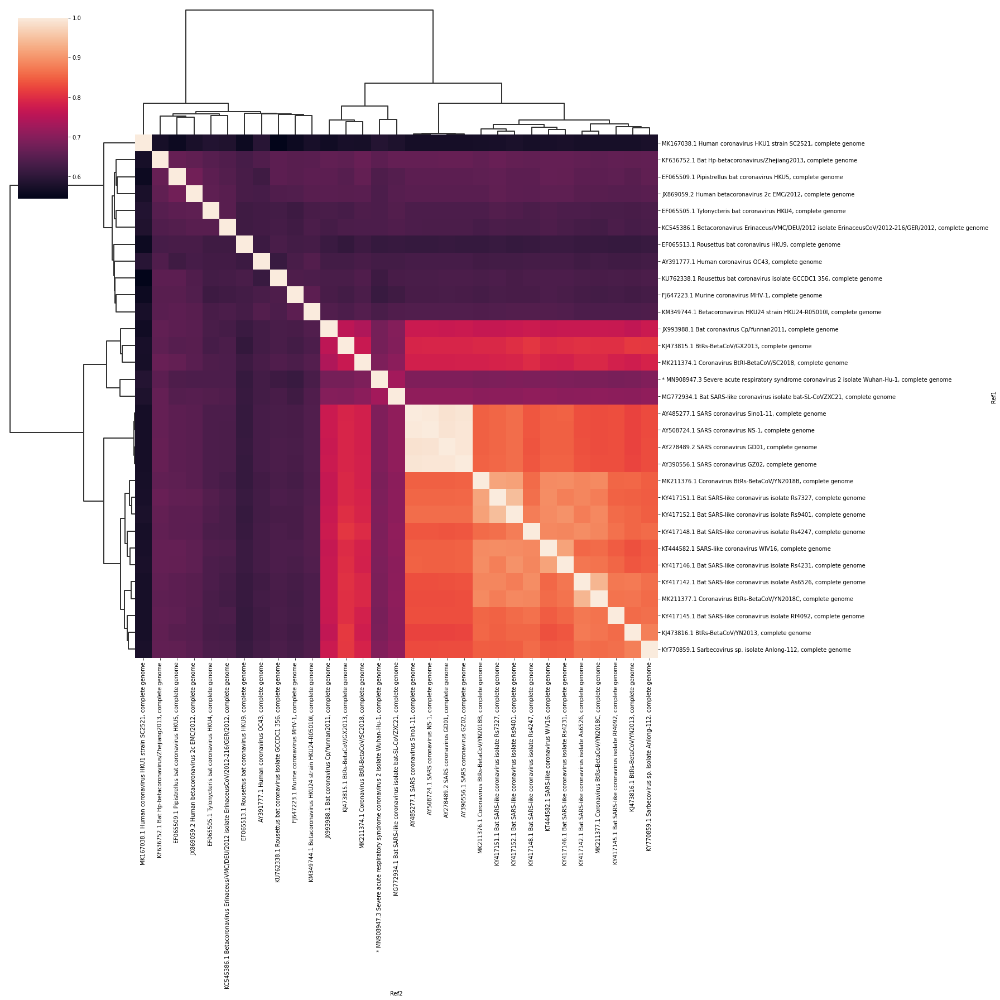

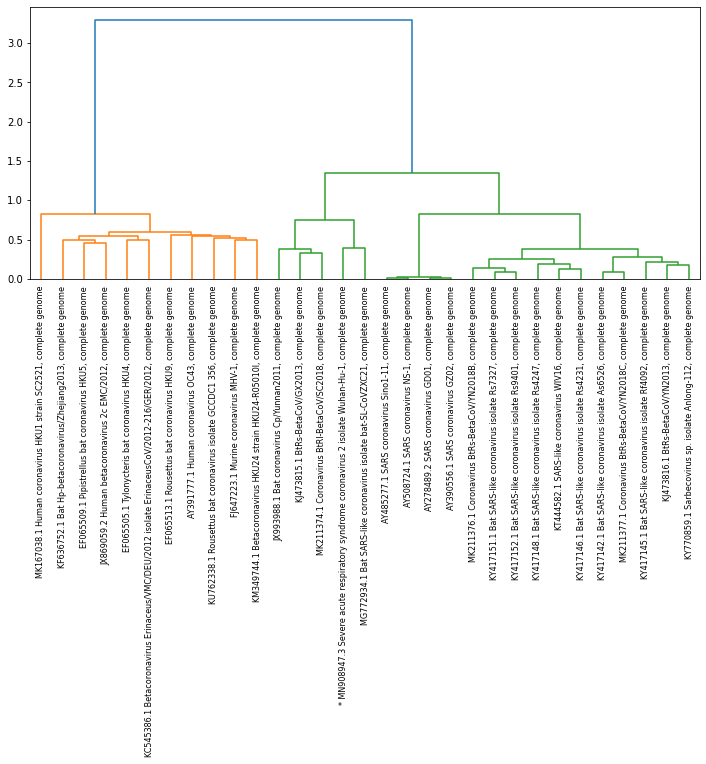

In [ ]:
## set k and w: no gaps (step = 1)
size, gap = 7,1
d = 5 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/2 - dataset1/Na Zhu 2020.fasta" ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(25, 25) )



plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'),
                                        leaf_rotation=90.,  # rotates the x axis labels
                                        leaf_font_size=8., labels=data_piv.index)

# Dataset 2: Beta Coronavirus

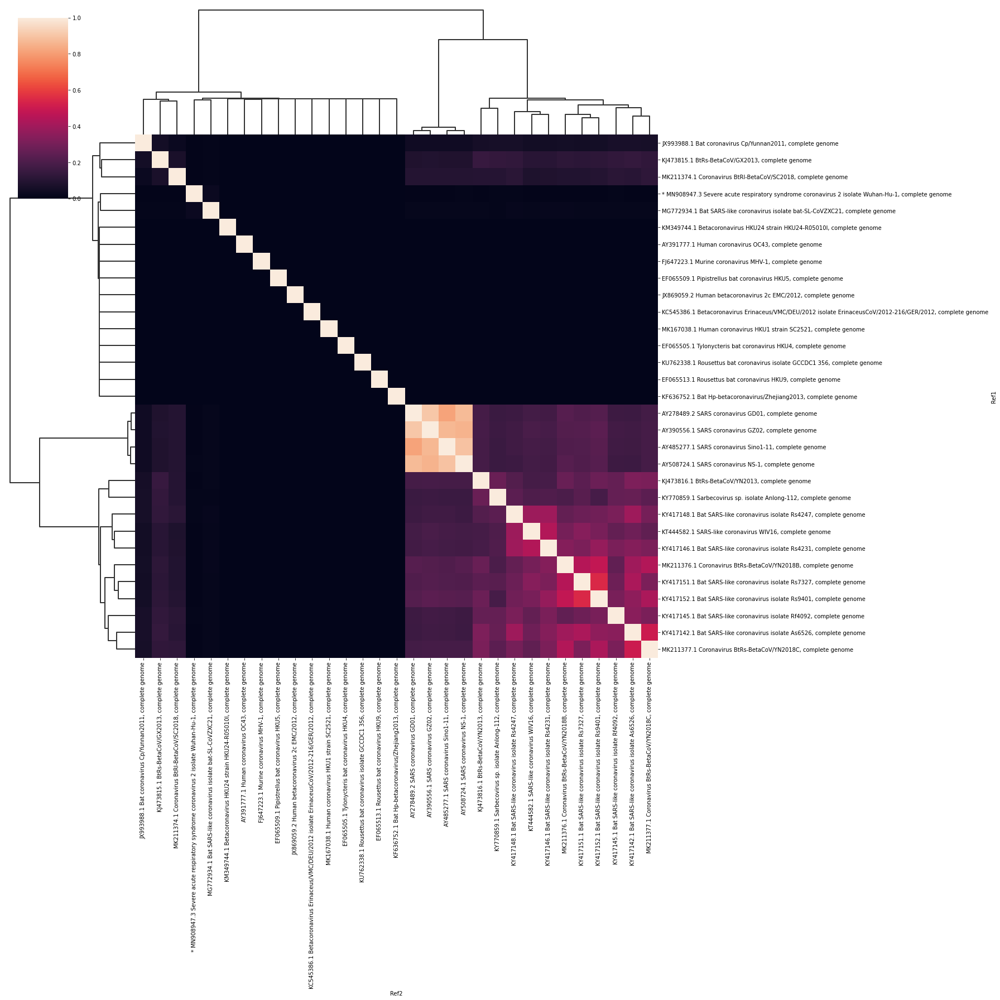

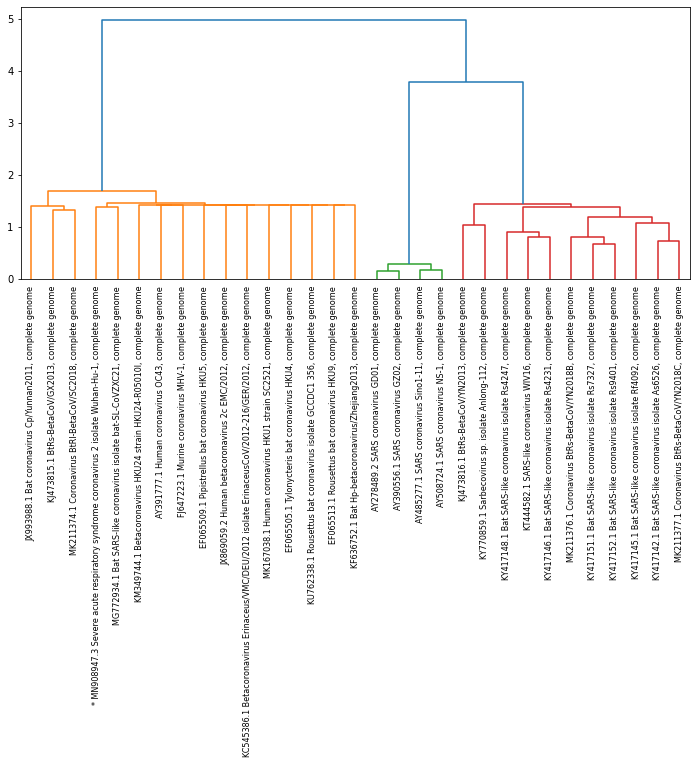

In [ ]:
## set k and w: no gaps (step = 1)
size, gap = 32,15
d = 4 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/2 - dataset1/Na Zhu 2020.fasta" ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(25, 25) )



plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'),
                                        leaf_rotation=90.,  # rotates the x axis labels
                                        leaf_font_size=8., labels=data_piv.index)

In [5]:
from importlib import reload  # Python 3.4+
sw3c = reload(sw3c)

# Dataset 3: SARS-CoV-2

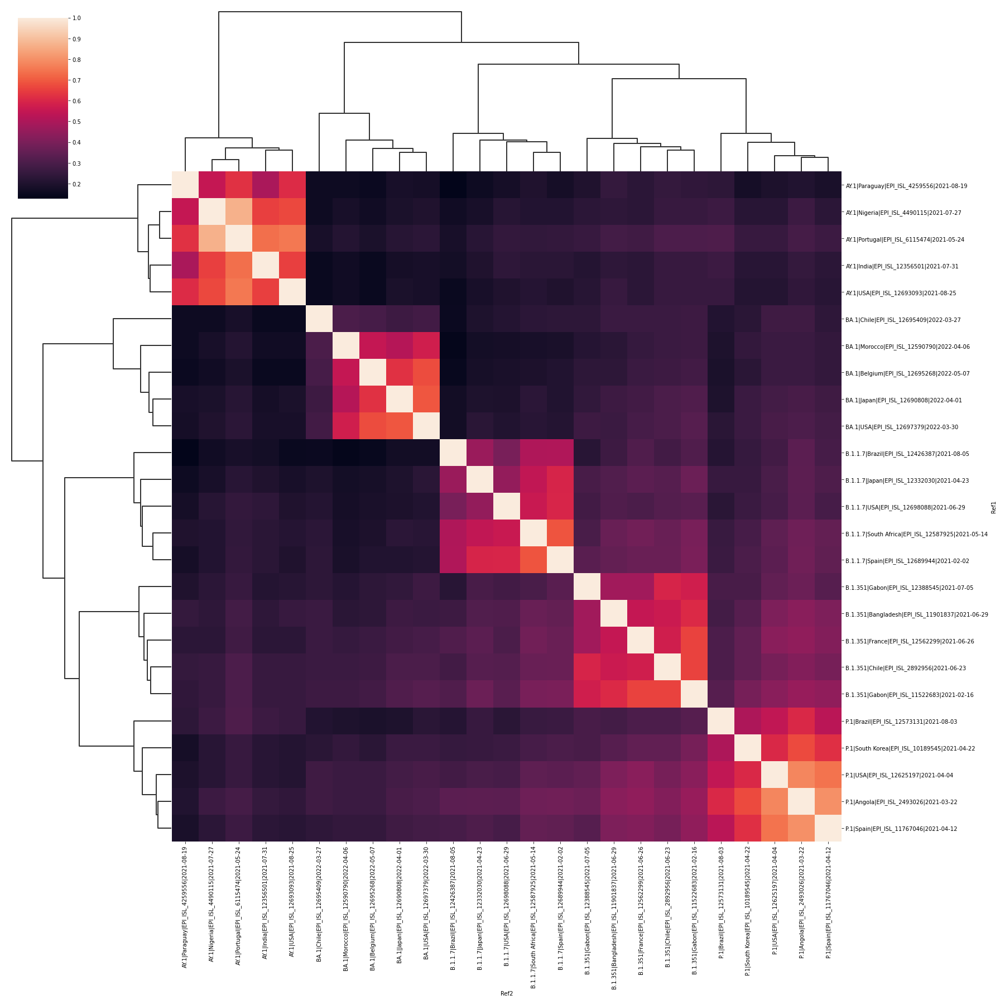

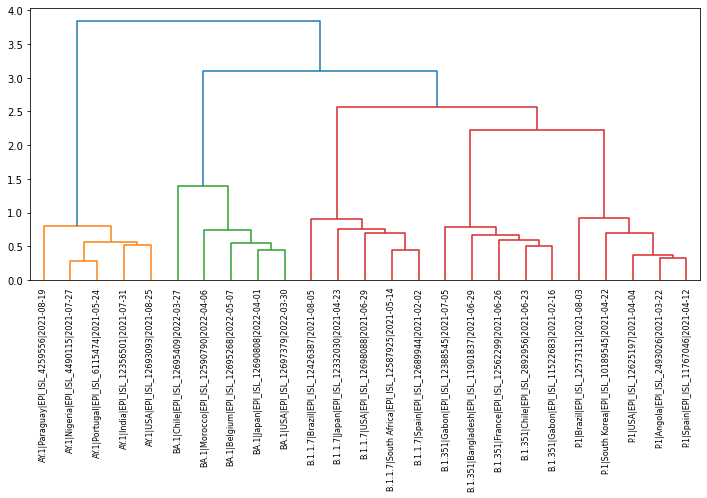

In [15]:
## set k and w: no gaps (step = 1)
size, gap = 500,250
d = 4 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/3 - dataset2/Essabbar A 2021.fasta" ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(25, 25) )



plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'),
                                        leaf_rotation=90.,  # rotates the x axis labels
                                        leaf_font_size=8., labels=data_piv.index)

In [4]:
dicSubseqs

{'BA.1|USA|EPI_ISL_12697379|2022-03-30': {'AGATCTGTTCTCTAAACGAACTTTAAAATCTGTGTGGCTGTCACTCGGCTGCATGCTTAGTGCACTCACGCAGTATAATTAATAACTAATTACTGTCGTTGACAGGACACGAGTAACTCGTCTATCTTCTGCAGGCTGCTTACGGTTTCGTCCGTGTTGCAGCCGATCATCAGCACATCTAGGTTTTGTCCGGGTGTGACCGAAAGGTAAGATGGAGAGCCTTGTCCCTGGTTTCAACGAGAAAACACACGTCCAACTCAGTTTGCCTGTTTTACAGGTTCGCGACGTGCT',
  'CGTAAAAACACAGTTCAATTATTATAAGAAAGTTGATGGTGTTGTCCAACAATTACCTGAAACTTACTTTACTCAGAGTAGAAATTTACAAGAATTTAAACCCAGGAGTCAAATGGAAATTGATTTCTTAGAATTAGCTATGGATGAATTCATTGAACGGTATAAATTAGAAGGCTATGCCTTCGAACATATCGTTTATGGAGATTTTAGTCATAGTCAGTTAGGTGGTTTACATCTACTGATTGGACTAGCTAAACGTTTTAAGGAATCACCTTTTGAATTAGAAGATTTTATTCCTATGGACAGTACAGTTAAAAACTATTTCATAACAGATGCGCAAACAGGTTCATCTAAGTGTGTGTGTTCTGTTATTGATTTATTACTTGATGATTTTGTTGAAATAATAAAATCCCAAGATTTATCTGTAGTTTCTAAGGTTGTCAAAGTGACTATTGACTATACAGAAATTTCATTTATGCTTTGGTGTAAAGATGGCCATGTAGAAACATTTTACCCAAAATTACAATCTAGTCAAGCGTGGCAACCGGGTGTTGCTATGCCTAATCTTTACAAAATGCAAAGAATGCTATTAGAAAAGTGTGACCTTCAAAATTATGGTGATAGTGCAACATTACCTAAAGGCATAATGATGAATGTCGC

# Dataset 4: mtDNA

AGCATC >>> 001001001101
CATCAA >>> 010011010000
TCAAAC >>> 110100000001
AAACTC >>> 000000011101
ACTCAA >>> 000111010000
TCAAAC >>> 110100000001
AAACTA >>> 000000011100
ACTACG >>> 000111000110
TACGCC >>> 110001100101
CGCCCT >>> 011001010111
CCCTGA >>> 010101111000
CTGATC >>> 011110001101
GATCGG >>> 100011011010
TCGGCG >>> 110110100110
GGCGCA >>> 101001100100
CGCACT >>> 011001000111
CACTGC >>> 010001111001
AGCAGG >>> 001001001010
CAGGAA >>> 010010100000
GGAATC >>> 101000001101
AATCTT >>> 000011011111
TCTTCT >>> 110111110111
TTCTTA >>> 111101111100
CTTACT >>> 011111000111
TACTCA >>> 110001110100
CTCATC >>> 011101001101
CATCCG >>> 010011010110
TCCGCT >>> 110101100111
CGCTTC >>> 011001111101
CTTCCA >>> 011111010100
TCCACC >>> 110101000101
CACCCC >>> 010001010101
AGCAAT >>> 001001000011
CAATCT >>> 010000110111
ATCTCA >>> 001101110100
CTCAAT >>> 011101000011
CAATTA >>> 010000111100
ATTACA >>> 001111000100
TACAAT >>> 110001000011
CAATAT >>> 010000110011
ATATAT >>> 001100110011
ATATAC >>> 00110

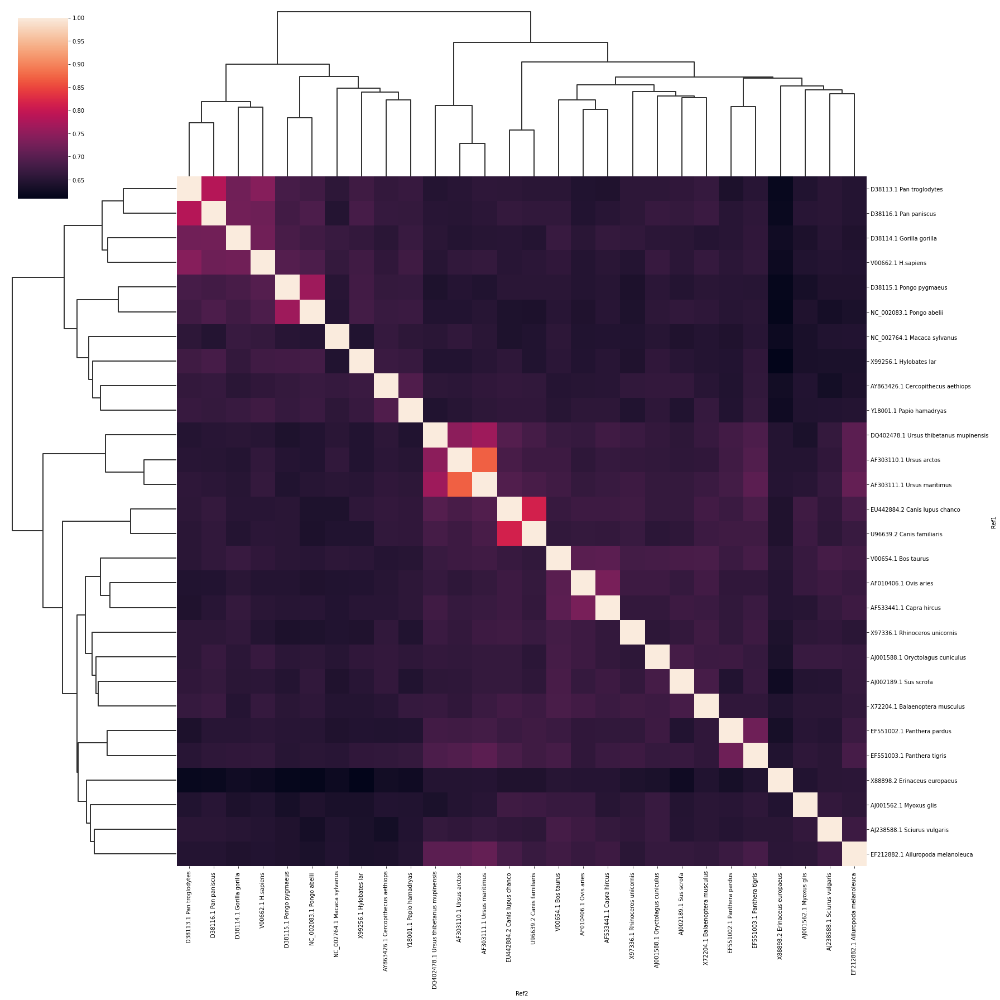

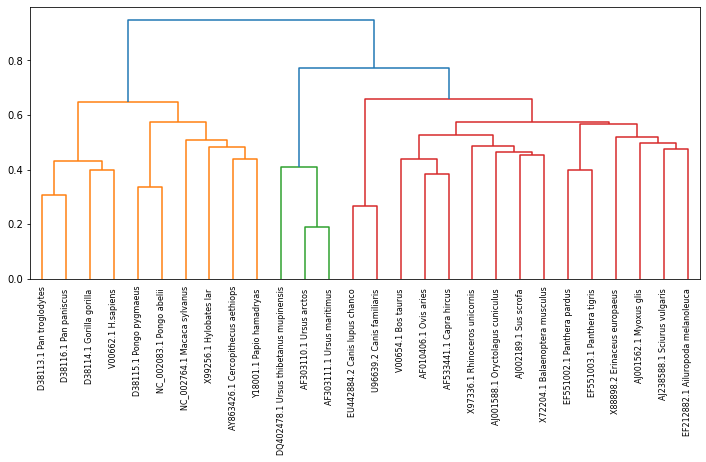

In [ ]:

size, gap = 6,2
d = 4 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/4 - dataset4/mtDNA.fasta" ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(25, 25) )



plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'),
                                        leaf_rotation=90.,  # rotates the x axis labels
                                        leaf_font_size=8., labels=data_piv.index)

# Bacterial using 1 conting

{'A': {'ACGGTTTTCACTAATCGGCGTACTAGATCCGCCTGATTTGGTTCCTTCTACTACCTATGCGCTGTATGGCGAACTCC',
  'ATGTATTCTGTGTTACGGTCATC'},
 'A0': {'ACGGTTTTCACTAATCGGCGTACTAGATCCGCCTGATTTTGTTCCTTCTACTACCTATGCGCTGTATGGCGAACTCC',
  'ATGTATTCTGTGTTACGGTCATC'},
 'A1': {'ACGGTATTCACTAATCGGCGTACTAGATCCGCCTGATTTTGTTCCTTCTACTACCTATGCGCTGTATGGCGAACTCC',
  'ATGTATTCTGTGTTACGGTCATC'},
 'A2': {'ACGGTATTCACTAATCGGCGTAATAGATCCGCCTGATTTTGTTCCTTCTACTACCTATGCGCTGTATGGCGAACTCC',
  'ATGTATTCTGTGTTACGGTCATC'},
 'A3': {'ACGGTATTCACTAATCGGCGTAATAGATCCGCCTGATTTTGTTCCTTCTACTACCTATGCGCTATATGGCGAACTCC',
  'ATGTATTCTGTGTTACGGTCATC'},
 'A4': {'ACGGTATTCACTAATCGGCGTAATAGATCCGCCTGATTTTGTTCCTTCTACTACCTATGCGCTATATGGCGAACTCC',
  'ATGTATCCTGTGTTACGGTCATC'},
 'A5': {'ACGGTATTTACTAATCGGCGTAATAGATCCGCCTGATTTTGTTCCTTCTACTACCTATGCGCTATATGGCGAACTCC',
  'ATGTATCCTGTGTTACGGTCATC'},
 'A6': {'ACGGTATTTACTAATCGGCGTAATAGATCCGCCTGATTTTGTTCCTTCTACTACCTATGCGCTATATGGCGTACTCC',
  'ATGTATCCTGTGTTACGGTCATC'},
 'A7': {'ACGGTATTTACTAATCGGCGTAATAGATCCGCCTGATTTT

In [ ]:
input = 'UC6.contigs.fa'

size, gap = 7, 1
d = 4 # delimiter size

delim = sw3c.random_delimiter(d) #select delimiter
dictSeqs = sw3c.dict_of_seqs_from_file("./data/5 - dataset5/contigs/"+input ) #load from file
dicSubseqs = sw3c.dictSubSeq_from_dictSeq(dictSeqs, delim) #remake seqs using delim
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)

map = sns.clustermap(data_piv, method='ward', tree_kws=dict(linewidths=2 ), figsize=(25, 25) )



plt.figure(figsize=(12, 5))  
dend = shc.dendrogram(shc.linkage(data_piv, method='ward'),
                                        leaf_rotation=90.,  # rotates the x axis labels

                                        leaf_font_size=8., labels=data_piv.index)

In [ ]:
from os import listdir
from os.path import isfile, join

In [ ]:

def dictSubSeq_from_repo(repo): #read all files in a repo and split them into subseqs
    SubSeqDict = {}
    c = 0
    files = [repo + '/' + f for f in listdir(repo) if isfile(join(repo, f))]
    for filename in files:
        c+=1
        print(c, filename)
        lines = open(filename,'r').readlines()
        for line in lines:
            line = line.replace('\n','')
            if '>' in line:
                id = '.'.join(line[1:].split('.')[:2])
                if id not in SubSeqDict.keys():
                    Seq = ''
                    SubSeqDict[id] = ''
                    print(id)
            else:
                Seq += line # merge multiple lines into one
        SubSeqDict[id]=Seq 
    return SubSeqDict

In [ ]:
#pip install matplotlib numpy pandas seaborn

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure
import seaborn as sns
import random
import sys
from itertools import combinations
import scipy.cluster.hierarchy as shc

from os import listdir
from os.path import isfile, join

%cd ..
from src import sw3c, evolution_simulator 

/home/mounim/Projects/SW3C


In [24]:
size, gap = 9,7

dicSubseqs = sw3c.dictSubSeq_from_repo('./data/5 - dataset5/contigs')
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)


Ref2,MC16.MG13,MC16.MG14,MC20.MG1,MC20.MG10,MC20.MG11,MC20.MG12,MC20.MG13,MC20.MG14,MC20.MG15,MC20.MG16,...,MC20.MG34,MC20.MG35,MC20.MG36,MC20.MG37,MC20.MG4,MC20.MG5,MC20.MG6,MC20.MG7,MC20.MG8,MC20.MG9
Ref1,,,,,,,,,,,,,,,,,,,,,
MC16.MG13,1.000000,0.995722,0.994783,0.993412,0.992888,0.980535,0.940600,0.975221,0.988311,0.990997,...,0.995329,0.996135,0.995848,0.994428,0.991707,0.991193,0.990470,0.991409,0.993312,0.987964
MC16.MG14,0.995722,1.000000,0.995696,0.994356,0.993505,0.981042,0.941012,0.975806,0.988823,0.991743,...,0.996249,0.997207,0.996936,0.995386,0.992294,0.992038,0.991224,0.992026,0.994012,0.988430
MC20.MG1,0.994783,0.995696,1.000000,0.993401,0.992565,0.980607,0.940799,0.975211,0.988095,0.990925,...,0.995378,0.996093,0.995738,0.994333,0.991544,0.991174,0.990330,0.991056,0.993194,0.987854
MC20.MG10,0.993412,0.994356,0.993401,1.000000,0.991665,0.980195,0.940288,0.974833,0.987535,0.990290,...,0.994030,0.994753,0.994489,0.993365,0.990644,0.990601,0.989588,0.990391,0.992119,0.987112
MC20.MG11,0.992888,0.993505,0.992565,0.991665,1.000000,0.979546,0.939812,0.974025,0.986888,0.989407,...,0.993232,0.993833,0.993615,0.992544,0.989754,0.989513,0.988919,0.989706,0.991442,0.986737
MC20.MG12,0.980535,0.981042,0.980607,0.980195,0.979546,1.000000,0.932936,0.965672,0.977099,0.979178,...,0.981100,0.981220,0.981243,0.980848,0.979179,0.978916,0.978514,0.979084,0.980084,0.976267
MC20.MG13,0.940600,0.941012,0.940799,0.940288,0.939812,0.932936,1.000000,0.931792,0.938119,0.939495,...,0.940914,0.941085,0.941090,0.940593,0.939705,0.939428,0.939347,0.939366,0.940029,0.937028
MC20.MG14,0.975221,0.975806,0.975211,0.974833,0.974025,0.965672,0.931792,1.000000,0.971865,0.973939,...,0.975478,0.975691,0.975712,0.975042,0.973897,0.974086,0.973570,0.973755,0.974630,0.970838
MC20.MG15,0.988311,0.988823,0.988095,0.987535,0.986888,0.977099,0.938119,0.971865,1.000000,0.986094,...,0.988603,0.989001,0.988858,0.988134,0.986191,0.986330,0.985552,0.986226,0.987396,0.982882


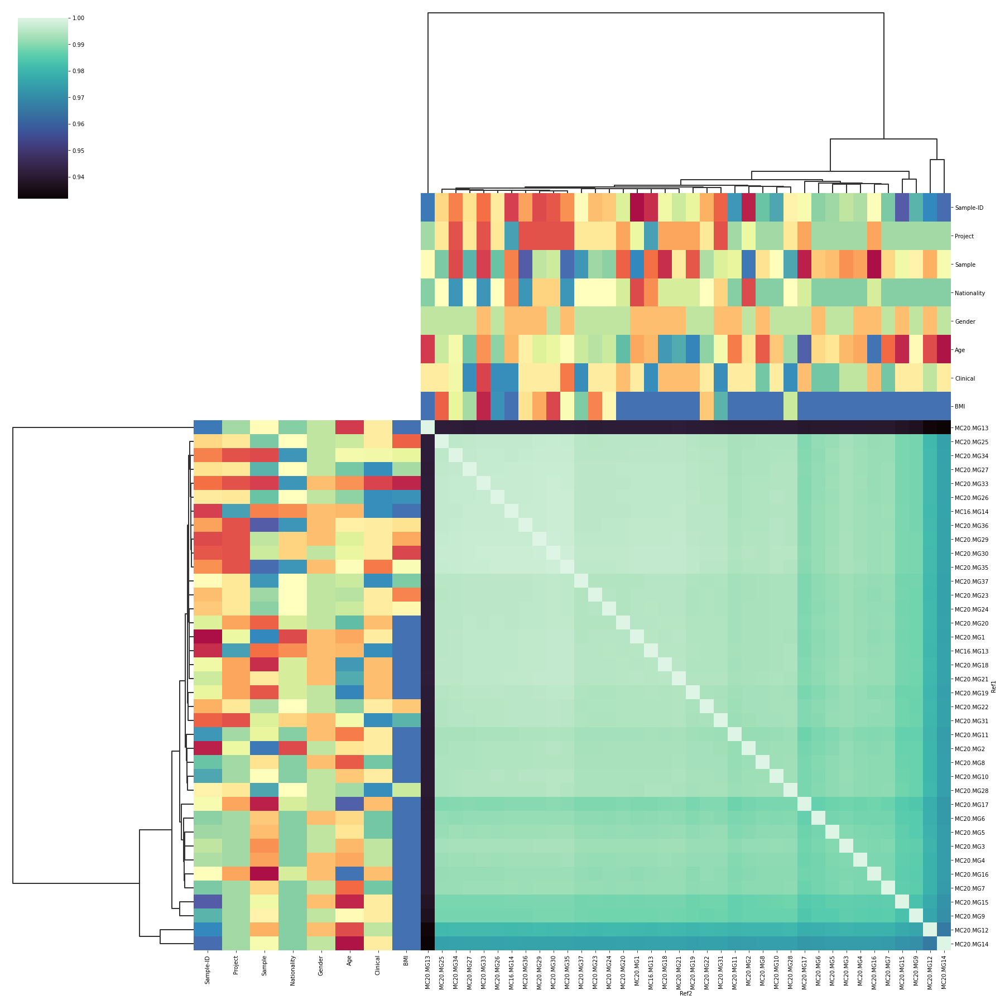

In [25]:
metadata = pd.read_csv('data/5 - dataset5/metadata.csv', index_col=0)

lables = metadata.loc[data_piv.index,:]

row_colors = {}
# for label in ['Stage_simplified']:
for label in lables.columns:
    values = lables[label]
    u_vals = values.unique()
    u_vals.sort()
    color_pal = sns.color_palette("Spectral", len(u_vals))
    lut = dict(zip(u_vals, color_pal)) #Create a dictionary where the key is the category and the values are the colors from the palette we just created
    row_colors[label] = pd.Series(values).map(lut) #map the colors to the series. Now we have a list of colors the same length as our dataframe, where unique values are mapped to the same color
row_colors = pd.DataFrame(row_colors)

sns.clustermap(data_piv, tree_kws=dict(linewidths=2 ), figsize=(25, 25) , row_colors=row_colors, col_colors=row_colors , cmap = 'mako' )


In [27]:
size, gap = 25,7

dicSubseqs = sw3c.dictSubSeq_from_repo('./data/5 - dataset5/contigs')
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt_25_7 = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt_25_7.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt_25_7)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)


: 

: 

In [1]:
metadata = pd.read_csv('data/5 - dataset5/metadata.csv', index_col=0)

lables = metadata.loc[data_piv.index,:]

row_colors = {}
# for label in ['Stage_simplified']:
for label in lables.columns:
    values = lables[label]
    u_vals = values.unique()
    u_vals.sort()
    color_pal = sns.color_palette("Spectral", len(u_vals))
    lut = dict(zip(u_vals, color_pal)) #Create a dictionary where the key is the category and the values are the colors from the palette we just created
    row_colors[label] = pd.Series(values).map(lut) #map the colors to the series. Now we have a list of colors the same length as our dataframe, where unique values are mapped to the same color
row_colors = pd.DataFrame(row_colors)

sns.clustermap(data_piv, tree_kws=dict(linewidths=2 ), figsize=(25, 25) , row_colors=row_colors, col_colors=row_colors , cmap = 'mako' )


NameError: name 'pd' is not defined

In [2]:
size, gap = 50,25

dicSubseqs = sw3c.dictSubSeq_from_repo('./data/5 - dataset5/contigs')
dictKmers = sw3c.dictKmer_from_DictSubseq(dicSubseqs, size, gap) # make chunks


Rslt_250_100 = []
for i in dictKmers.keys(): # S1: ref
    for j in dictKmers.keys(): # S2: target
        INT = dictKmers[i].intersection(dictKmers[j])
        UNI = dictKmers[i].union(dictKmers[j])
        Score = len(INT) / len(UNI)
        Rslt_250_100.append([ i, len(dictKmers[i]), j, len(dictKmers[j]), len(INT), len(UNI), Score])

df = pd.DataFrame(Rslt_250_100)

df.columns = ['Ref1','LenRef1','Ref2','LenRef2','INT','UNI','SCORE']

data_piv = df[['Ref1','Ref2','SCORE']].pivot('Ref1','Ref2','SCORE').fillna(0)


: 

: 

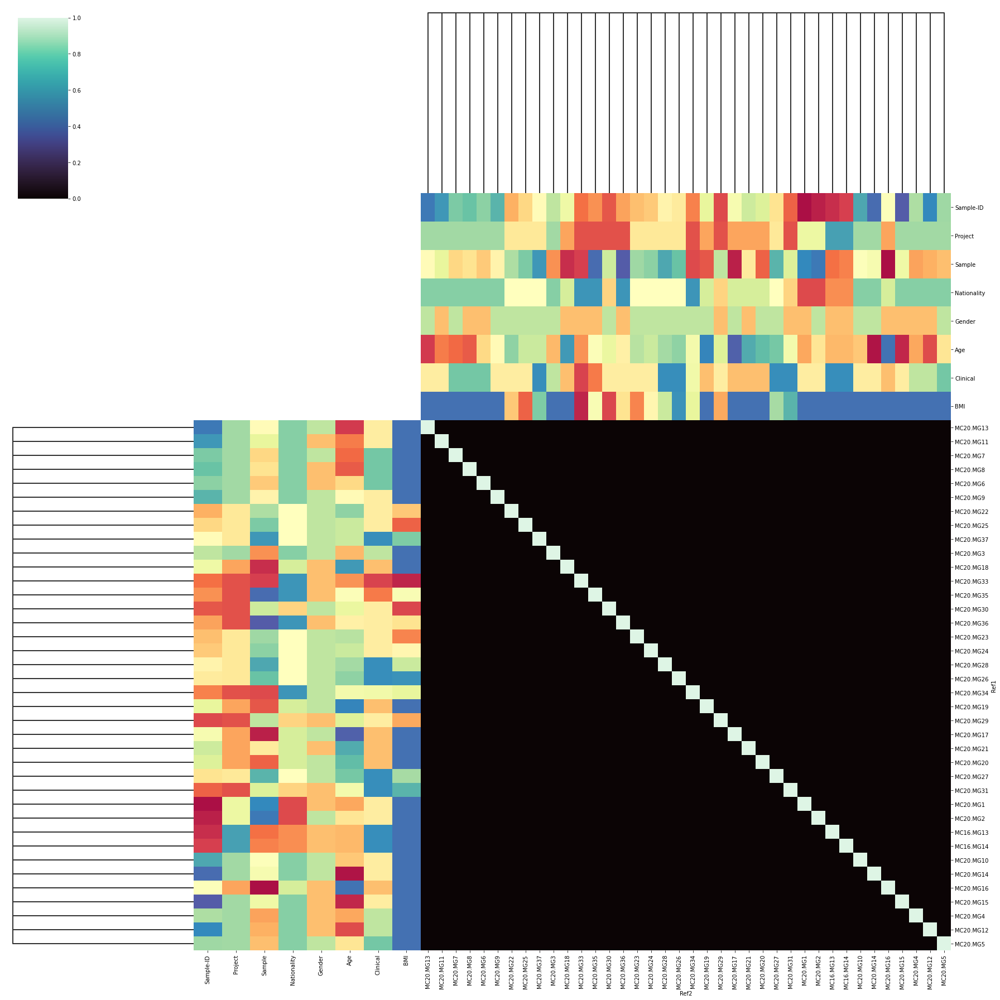

: 

In [ ]:
metadata = pd.read_csv('data/5 - dataset5/metadata.csv', index_col=0)

lables = metadata.loc[data_piv.index,:]

row_colors = {}
# for label in ['Stage_simplified']:
for label in lables.columns:
    values = lables[label]
    u_vals = values.unique()
    u_vals.sort()
    color_pal = sns.color_palette("Spectral", len(u_vals))
    lut = dict(zip(u_vals, color_pal)) #Create a dictionary where the key is the category and the values are the colors from the palette we just created
    row_colors[label] = pd.Series(values).map(lut) #map the colors to the series. Now we have a list of colors the same length as our dataframe, where unique values are mapped to the same color
row_colors = pd.DataFrame(row_colors)

sns.clustermap(data_piv, tree_kws=dict(linewidths=2 ), figsize=(25, 25) , row_colors=row_colors, col_colors=row_colors , cmap = 'mako' )
